In [1]:
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt 

In [2]:
import os

In [3]:
os.listdir()

['.git',
 'Airline Satisfaction.ipynb',
 'apartments.ipynb',
 'bbc_data.ipynb',
 'CarsData.ipynb',
 'credit_card.ipynb',
 'data',
 'financial data image.ipynb',
 'fractured_bones.ipynb',
 'heart attack_prediction.ipynb',
 'household_powerconsumption.ipynb',
 'osteoporosis.ipynb',
 'Predict_hair.ipynb',
 'shein_eda.ipynb',
 'skin_types.ipynb',
 'Times series helper functions.ipynb',
 'Walmart_sales.csv',
 'walmart_sales.ipynb']

In [4]:
df = pd.read_csv(r'C:\Users\dgmur\OneDrive\Desktop\data science projects 2024\Data-Science-Practice\Walmart_sales.csv')

In [5]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [7]:
print(df.isnull().sum())

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64


In [8]:
df.nunique()

Store             45
Date             143
Weekly_Sales    6435
Holiday_Flag       2
Temperature     3528
Fuel_Price       892
CPI             2145
Unemployment     349
dtype: int64

In [9]:
df['Date_Time'] = pd.to_datetime(df['Date'], dayfirst=True)
df['Date'] = df['Date_Time'].dt.date
df['Day_name'] = df['Date_Time'].dt.day_name()
df['Week_number'] = df['Date_Time'].dt.isocalendar().week
df['Month'] = df['Date_Time'].dt.month_name()
df['Year'] = df['Date_Time'].dt.year


In [10]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Date_Time,Day_name,Week_number,Month,Year
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010-02-05,Friday,5,February,2010
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010-02-12,Friday,6,February,2010
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010-02-19,Friday,7,February,2010
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010-02-26,Friday,8,February,2010
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010-03-05,Friday,9,March,2010
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684,2012-09-28,Friday,39,September,2012
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667,2012-10-05,Friday,40,October,2012
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667,2012-10-12,Friday,41,October,2012
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667,2012-10-19,Friday,42,October,2012


Holiday_Flag
0    5985
1     450
Name: count, dtype: int64


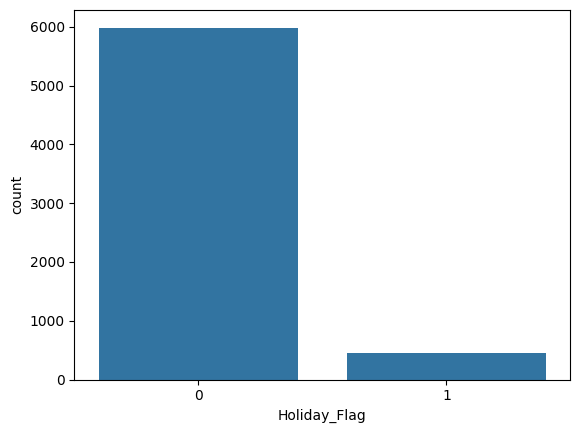

In [11]:
sns.countplot(data = df, x = 'Holiday_Flag')
print(df['Holiday_Flag'].value_counts())

<Axes: xlabel='Store', ylabel='count'>

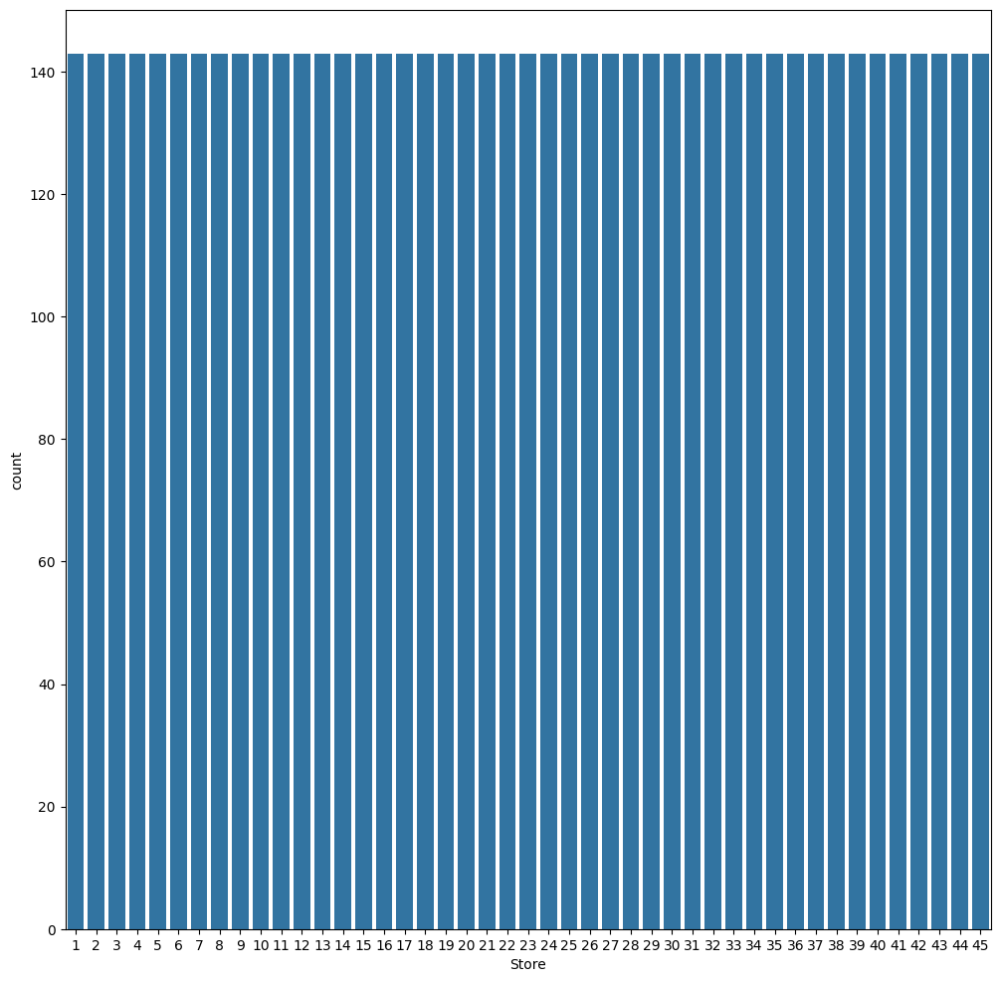

In [12]:
plt.figure(figsize=(12,12))
sns.countplot(data = df, x = 'Store')

<Axes: xlabel='Store', ylabel='Weekly_Sales'>

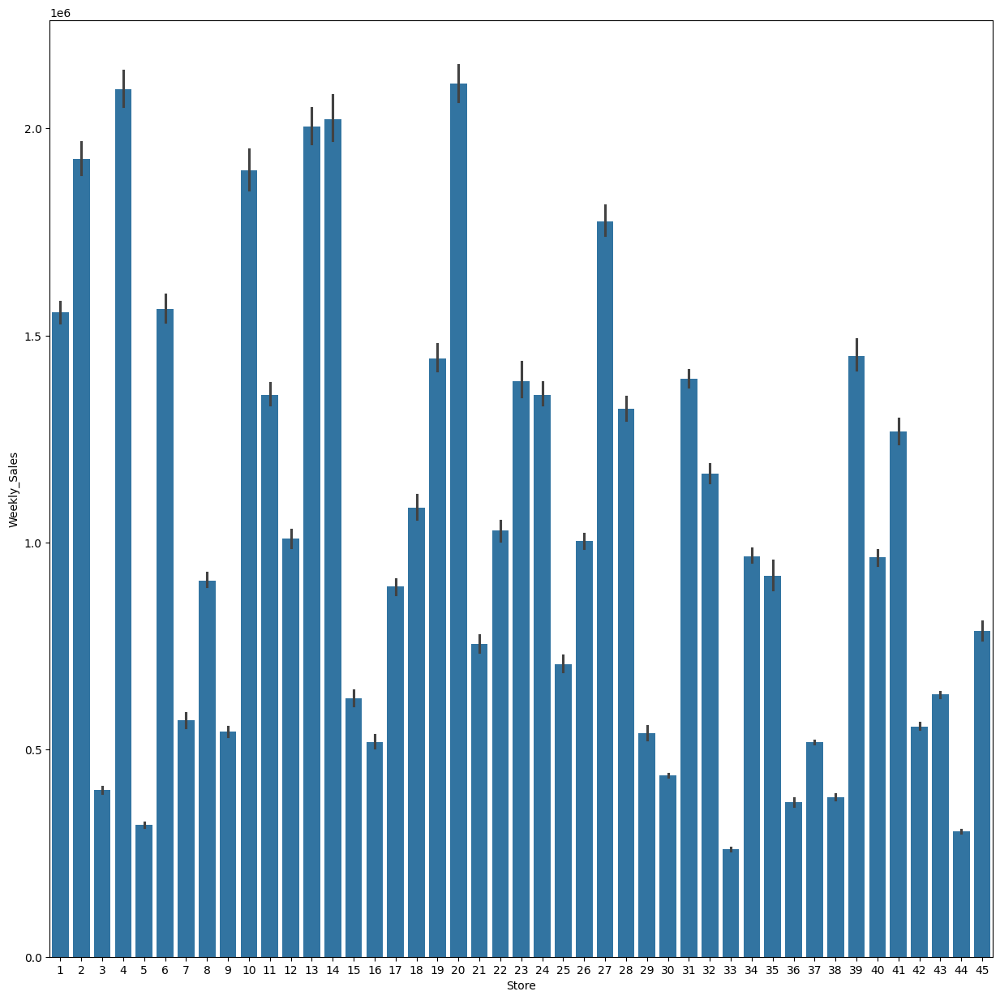

In [13]:
plt.figure(figsize=(15,15))
sns.barplot(data = df, x = 'Store', y = 'Weekly_Sales')

<Axes: xlabel='Store', ylabel='Weekly_Sales'>

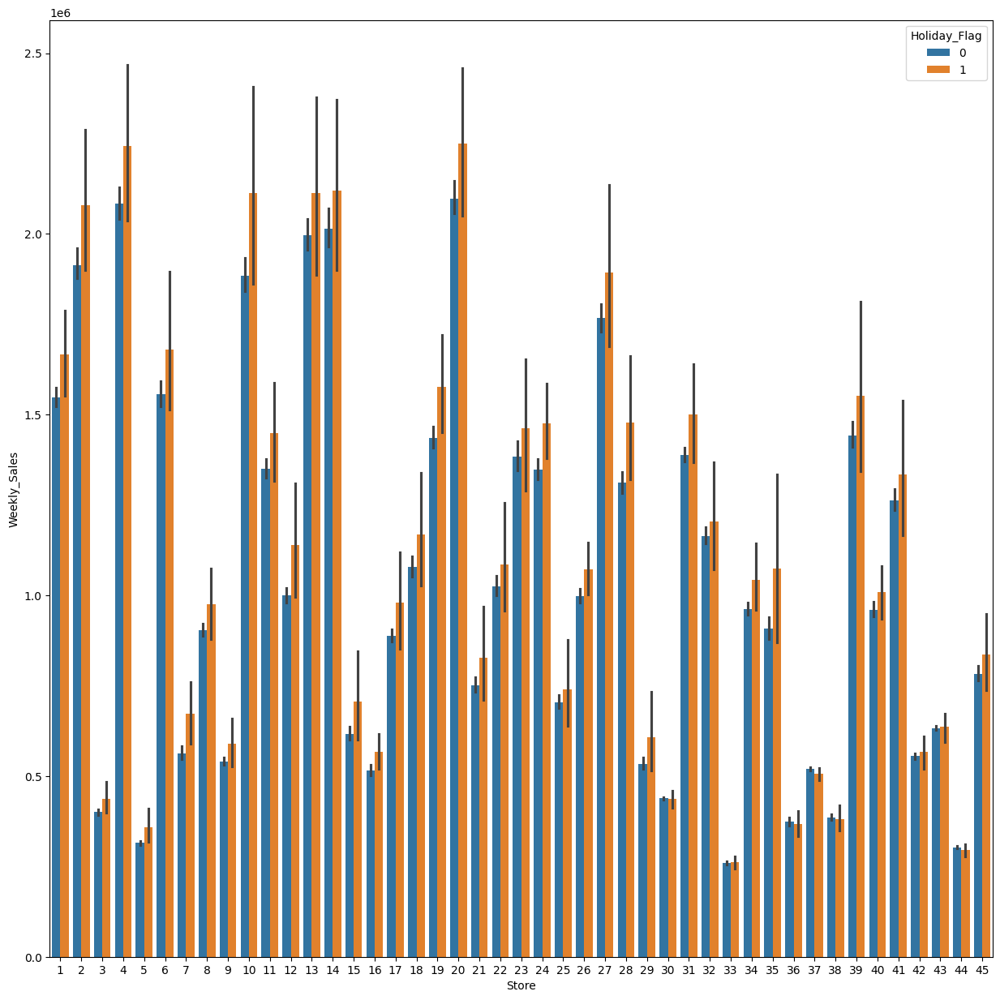

In [14]:
plt.figure(figsize=(15,15))
sns.barplot(data = df, x = 'Store', y = 'Weekly_Sales', hue = 'Holiday_Flag')

<Axes: xlabel='Store', ylabel='Weekly_Sales'>

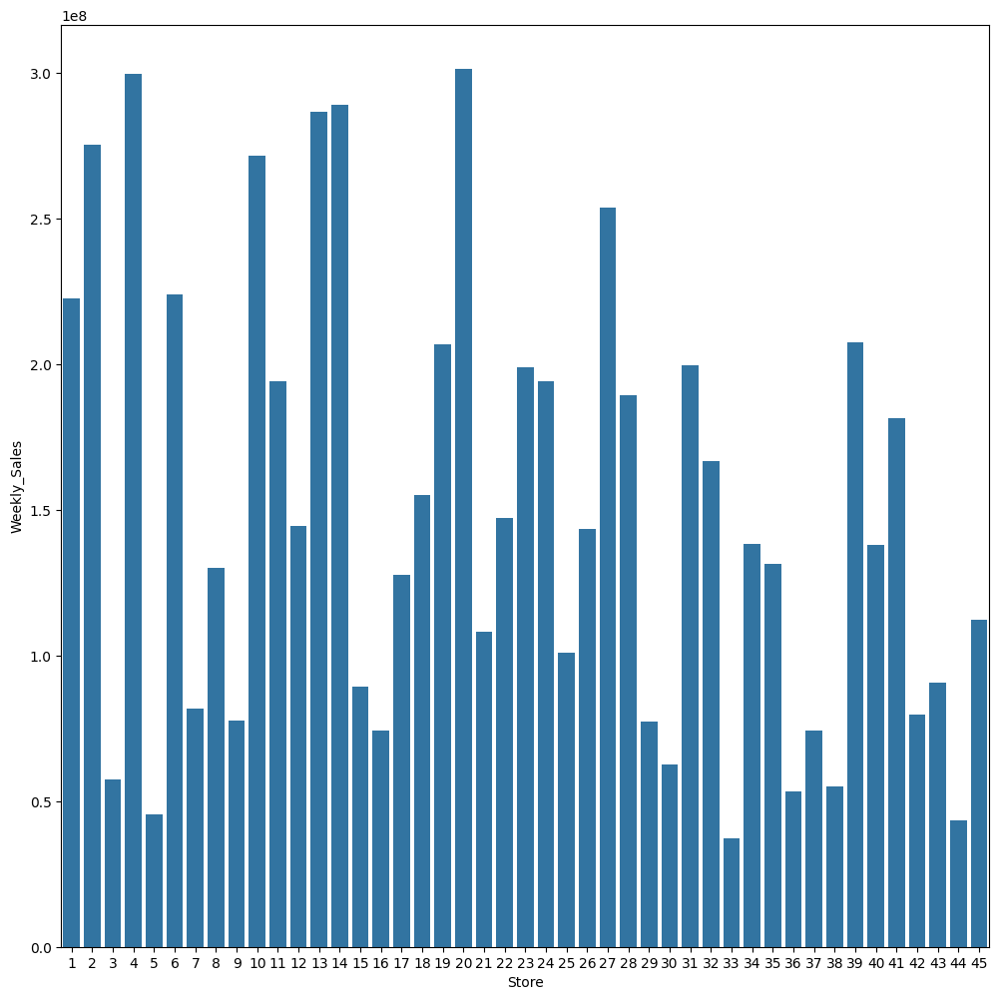

In [15]:
weekly_sales_total_by_store = df.groupby('Store')['Weekly_Sales'].sum().reset_index()
plt.figure(figsize=(12,12))
sns.barplot(data = weekly_sales_total_by_store, x = 'Store', y = 'Weekly_Sales')


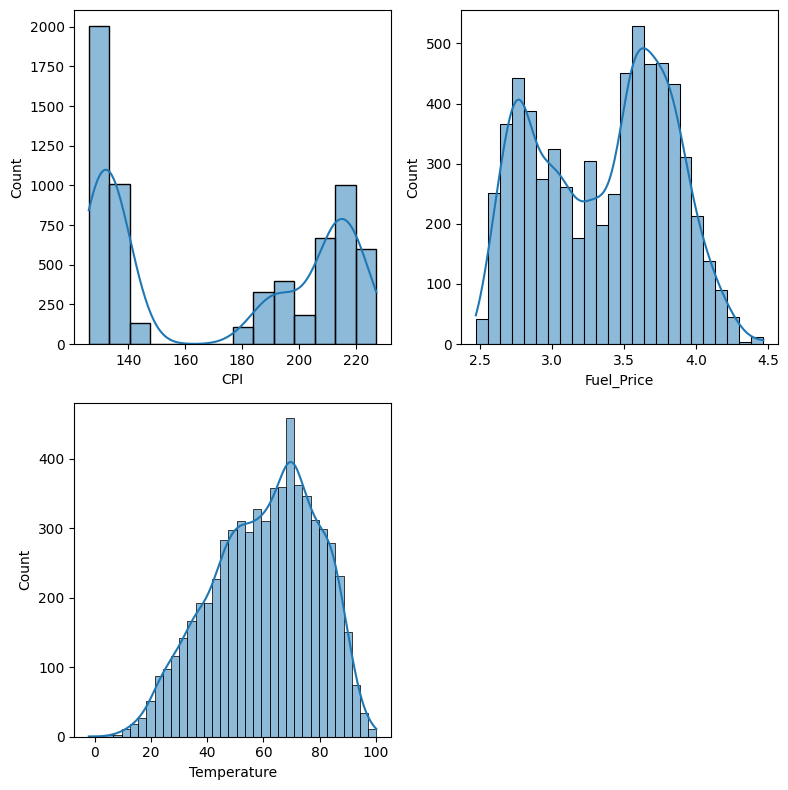

In [16]:
plt.figure(figsize=(8,8))
plt.subplot(2,2,1)
sns.histplot(df['CPI'], kde=True)
plt.subplot(2,2,2)
sns.histplot(df['Fuel_Price'], kde=True)
plt.subplot(2,2,3)
sns.histplot(df['Temperature'], kde=True)
plt.tight_layout()
plt.show()

In [17]:
df.describe().transpose()

,count,mean,min,25%,50%,75%,max,std
Store,6435.0,23.0,1.0,12.0,23.0,34.0,45.0,12.988182
Weekly_Sales,6435.0,1046964.877562,209986.25,553350.105,960746.04,1420158.66,3818686.45,564366.622054
Holiday_Flag,6435.0,0.06993,0.0,0.0,0.0,0.0,1.0,0.255049
Temperature,6435.0,60.663782,-2.06,47.46,62.67,74.94,100.14,18.444933
Fuel_Price,6435.0,3.358607,2.472,2.933,3.445,3.735,4.468,0.45902
CPI,6435.0,171.578394,126.064,131.735,182.616521,212.743293,227.232807,39.356712
Unemployment,6435.0,7.999151,3.879,6.891,7.874,8.622,14.313,1.875885
Date_Time,6435,2011-06-17 00:00:00,2010-02-05 00:00:00,2010-10-08 00:00:00,2011-06-17 00:00:00,2012-02-24 00:00:00,2012-10-26 00:00:00,NaN
Week_number,6435.0,25.818182,1.0,14.0,26.0,38.0,52.0,14.129201
Year,6435.0,2010.965035,2010.0,2010.0,2011.0,2012.0,2012.0,0.797019


Text(0.5, 1.0, 'Average Number of Weekly Sales per Month')

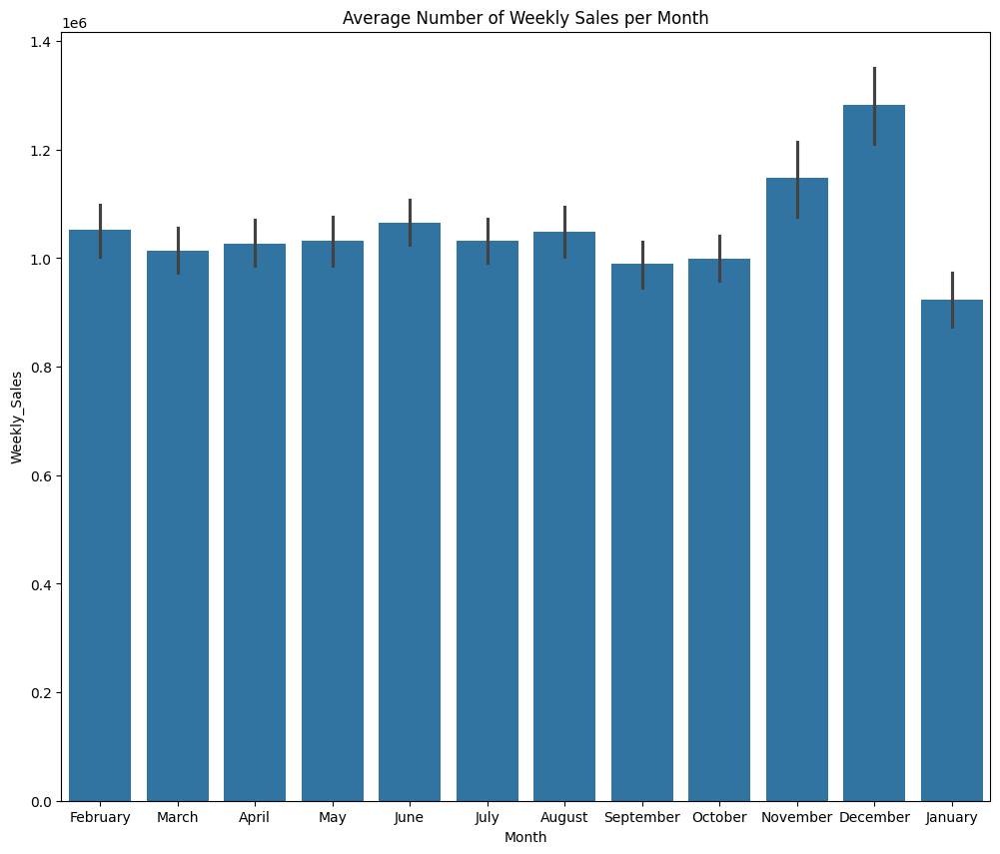

In [18]:
plt.figure(figsize=(12,10))
sns.barplot(data = df, x = 'Month', y = 'Weekly_Sales')
plt.title('Average Number of Weekly Sales per Month')

<Axes: xlabel='Month', ylabel='Weekly_Sales'>

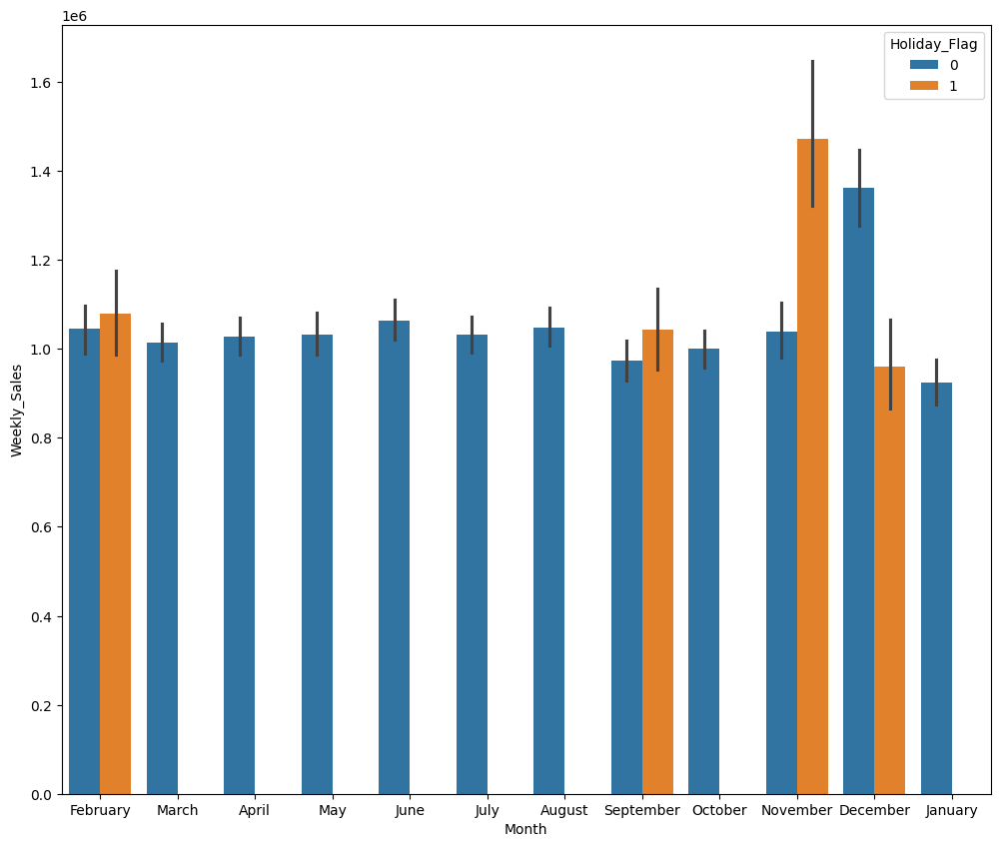

In [19]:
plt.figure(figsize=(12,10))
sns.barplot(data = df, x = 'Month', y = 'Weekly_Sales', hue = 'Holiday_Flag')

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   object        
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
 8   Date_Time     6435 non-null   datetime64[ns]
 9   Day_name      6435 non-null   object        
 10  Week_number   6435 non-null   UInt32        
 11  Month         6435 non-null   object        
 12  Year          6435 non-null   int32         
dtypes: UInt32(1), datetime64[ns](1), float64(5), int32(1), int64(2), object(3)
memory usage: 609.7+ KB


<Axes: xlabel='Weekly_Sales', ylabel='Temperature'>

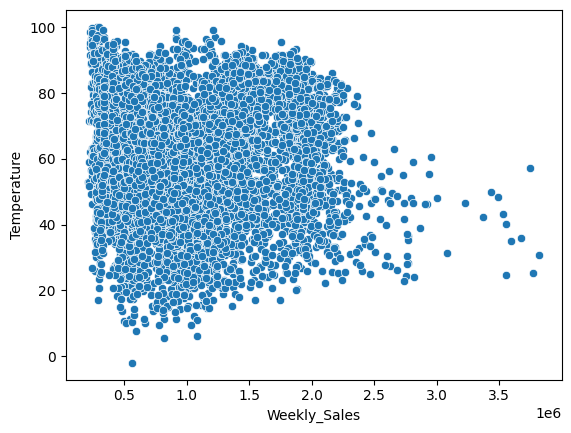

In [21]:
sns.scatterplot(data = df, x = 'Weekly_Sales', y = 'Temperature')

<Axes: xlabel='Weekly_Sales', ylabel='Fuel_Price'>

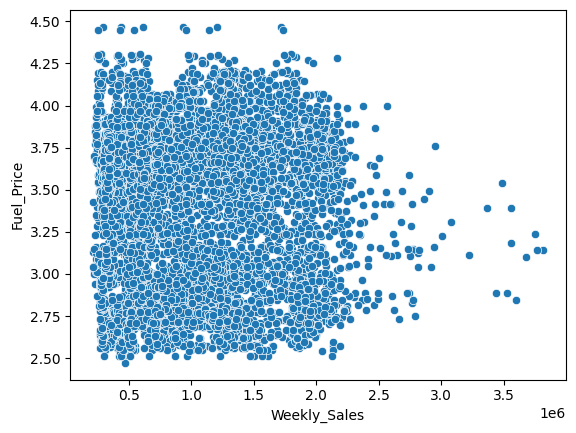

In [22]:
sns.scatterplot(data = df, x = 'Weekly_Sales', y = 'Fuel_Price')

<Axes: xlabel='Weekly_Sales', ylabel='CPI'>

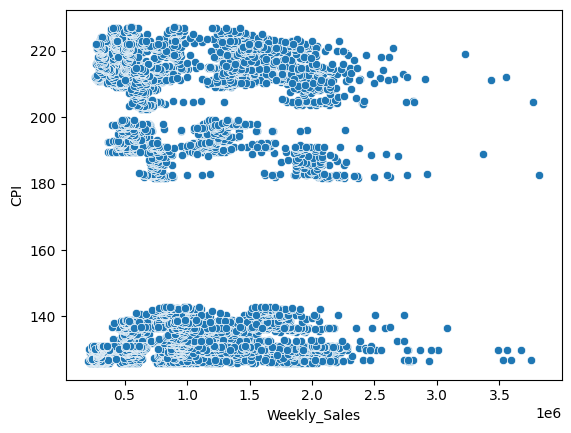

In [23]:
sns.scatterplot(data = df, x = 'Weekly_Sales', y = 'CPI')

<Axes: >

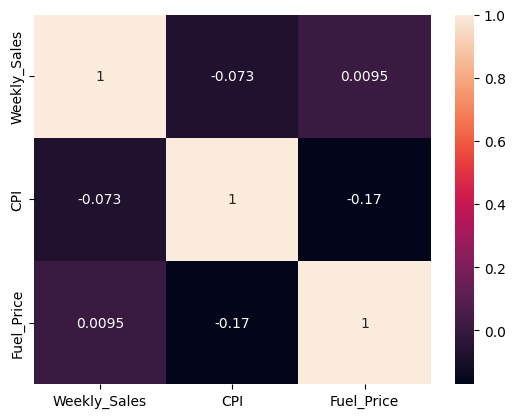

In [24]:
numerical_features = ['Weekly_Sales', 'CPI', 'Fuel_Price']
sns.heatmap(df[numerical_features].corr(), annot=True)

<Axes: xlabel='CPI', ylabel='Fuel_Price'>

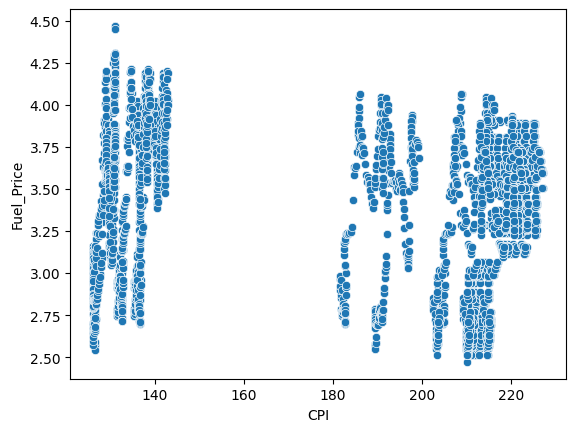

In [25]:
sns.scatterplot(x = df['CPI'], y = df['Fuel_Price'])

<Axes: xlabel='Date_Time', ylabel='Weekly_Sales'>

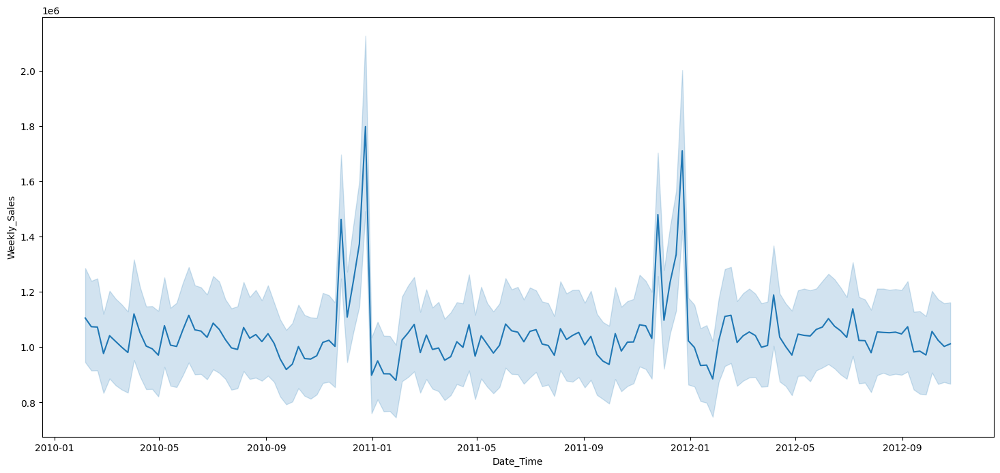

In [26]:
plt.figure(figsize=(18,8))
sns.lineplot(data = df, x = 'Date_Time', y = 'Weekly_Sales')

In [27]:
df = df.set_index('Date_Time')

<Axes: xlabel='Date_Time', ylabel='Rolling_Average_Sales_Monthly'>

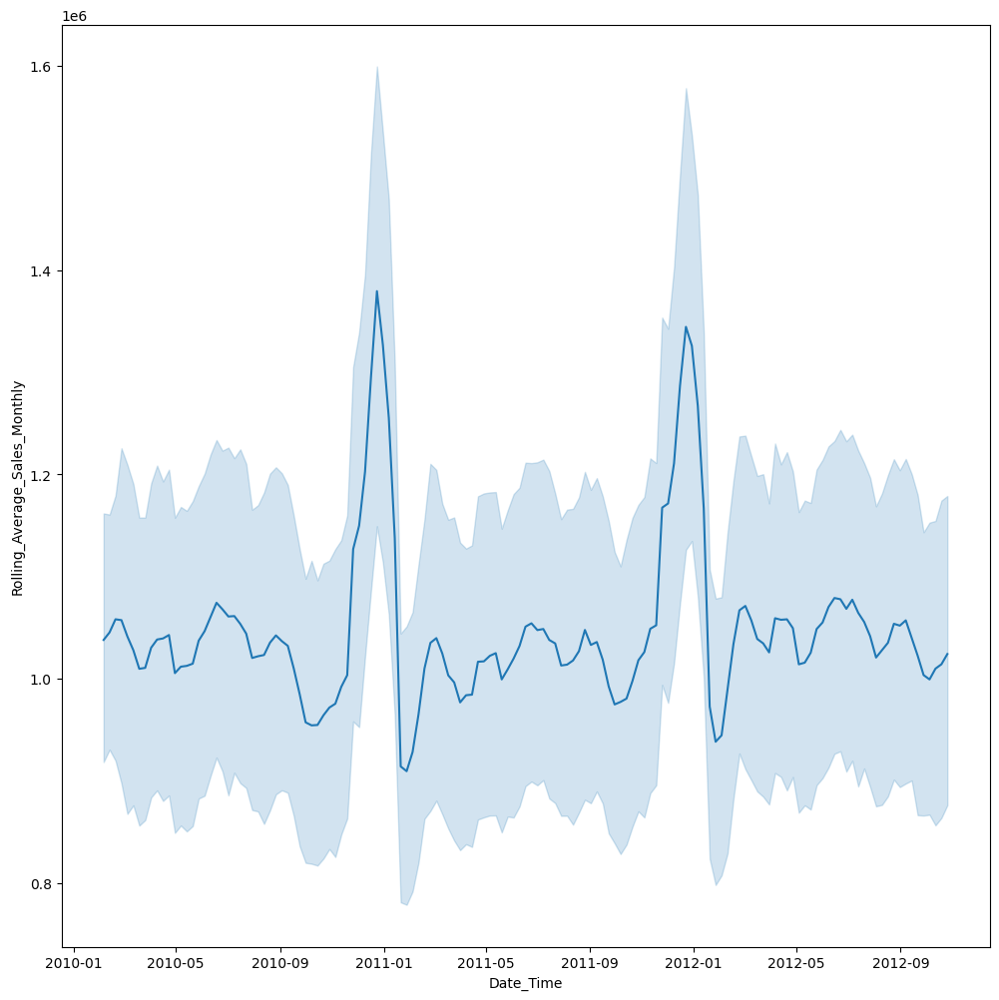

In [28]:
df['Rolling_Average_Sales_Monthly'] = df['Weekly_Sales'].rolling(window=4).mean()
plt.figure(figsize=(12,12))
sns.lineplot(df['Rolling_Average_Sales_Monthly'])

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6435 entries, 2010-02-05 to 2012-10-26
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Store                          6435 non-null   int64  
 1   Date                           6435 non-null   object 
 2   Weekly_Sales                   6435 non-null   float64
 3   Holiday_Flag                   6435 non-null   int64  
 4   Temperature                    6435 non-null   float64
 5   Fuel_Price                     6435 non-null   float64
 6   CPI                            6435 non-null   float64
 7   Unemployment                   6435 non-null   float64
 8   Day_name                       6435 non-null   object 
 9   Week_number                    6435 non-null   UInt32 
 10  Month                          6435 non-null   object 
 11  Year                           6435 non-null   int32  
 12  Rolling_Average_Sales_Monthly 

In [30]:
df['Month'] = pd.Categorical(df['Month'],categories=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'], ordered=True)

In [31]:
df['Year'] = df['Year'].astype('Int64')

In [32]:
seasonal_plot_df = df[~df['Year'].isin([2019, 2013])].groupby(['Year', 'Month'])['Weekly_Sales'].mean().reset_index()

C:\Users\dgmur\AppData\Local\Temp\ipykernel_25320\3155273744.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seasonal_plot_df = df[~df['Year'].isin([2019, 2013])].groupby(['Year', 'Month'])['Weekly_Sales'].mean().reset_index()


<Axes: xlabel='Month', ylabel='Weekly_Sales'>

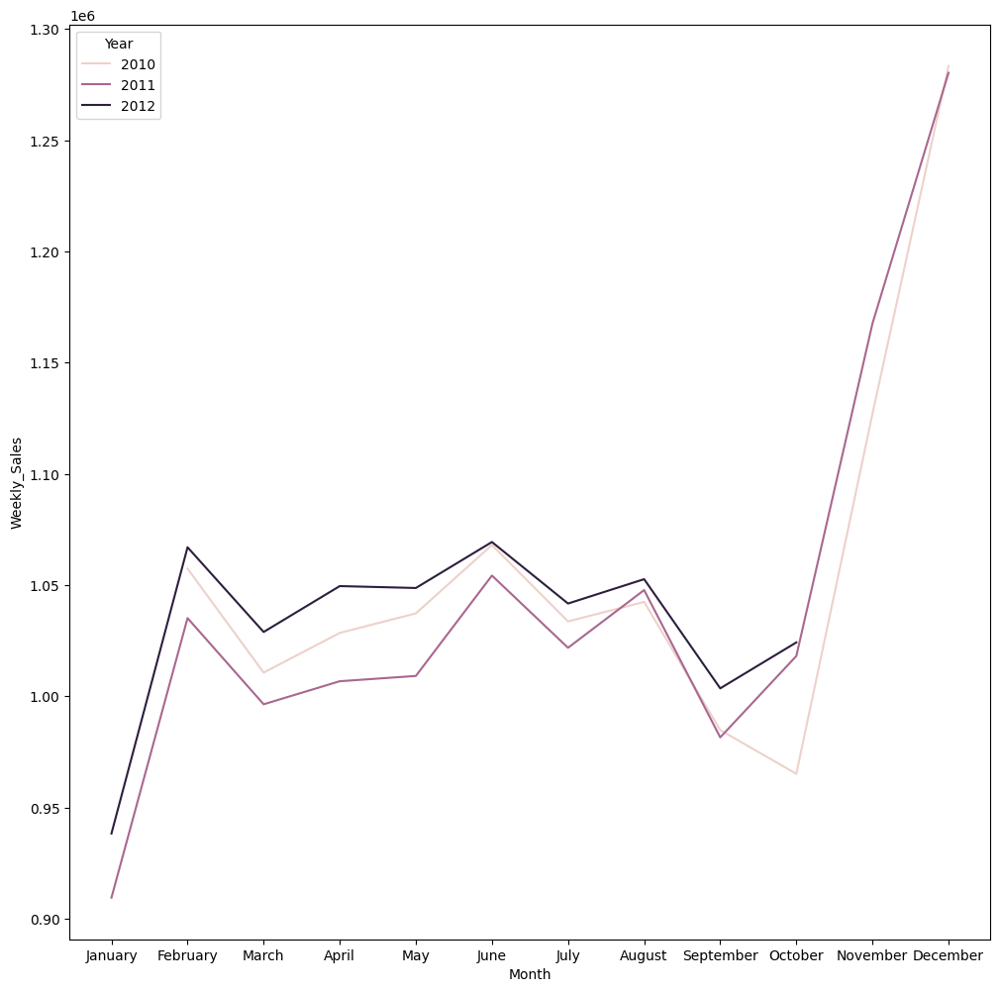

In [33]:
plt.figure(figsize=(12,12))
sns.lineplot(data = seasonal_plot_df, x = 'Month', y = 'Weekly_Sales', hue='Year')

In [34]:
import statsmodels.api as sm

In [35]:
seasonal_decomp_resid = sm.tsa.seasonal_decompose(x = df['Weekly_Sales'], period = 12*4, extrapolate_trend='freq')

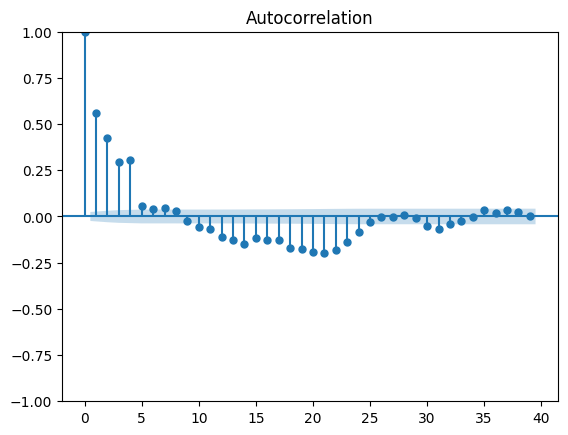

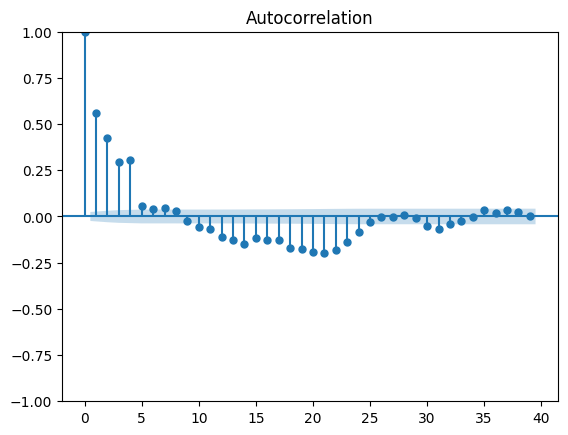

In [36]:
sm.tsa.graphics.plot_acf(seasonal_decomp_resid.resid)

In [37]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(df['Weekly_Sales'])

In [38]:
print(result[1])

0.00011655869699900234


Weekly Series does not have a unit root, indicating the series is stationary

In [39]:
result2 = adfuller(df['Weekly_Sales'], regression = 'ct')

In [40]:
print(result2[1])

0.00025426487940161796


In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6435 entries, 2010-02-05 to 2012-10-26
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   Store                          6435 non-null   int64   
 1   Date                           6435 non-null   object  
 2   Weekly_Sales                   6435 non-null   float64 
 3   Holiday_Flag                   6435 non-null   int64   
 4   Temperature                    6435 non-null   float64 
 5   Fuel_Price                     6435 non-null   float64 
 6   CPI                            6435 non-null   float64 
 7   Unemployment                   6435 non-null   float64 
 8   Day_name                       6435 non-null   object  
 9   Week_number                    6435 non-null   UInt32  
 10  Month                          6435 non-null   category
 11  Year                           6435 non-null   Int64   
 12  Rolling_Average_

In [42]:
df.drop(['Month', 'Year','Day_name'], axis = 1, inplace = True)
print(df)

            Store        Date  Weekly_Sales  Holiday_Flag  Temperature  \
Date_Time                                                                
2010-02-05      1  2010-02-05    1643690.90             0        42.31   
2010-02-12      1  2010-02-12    1641957.44             1        38.51   
2010-02-19      1  2010-02-19    1611968.17             0        39.93   
2010-02-26      1  2010-02-26    1409727.59             0        46.63   
2010-03-05      1  2010-03-05    1554806.68             0        46.50   
...           ...         ...           ...           ...          ...   
2012-09-28     45  2012-09-28     713173.95             0        64.88   
2012-10-05     45  2012-10-05     733455.07             0        64.89   
2012-10-12     45  2012-10-12     734464.36             0        54.47   
2012-10-19     45  2012-10-19     718125.53             0        56.47   
2012-10-26     45  2012-10-26     760281.43             0        58.85   

            Fuel_Price         CPI  U

In [43]:
for i in range(5):
    df[f'Weekly_Sales_lag{i}'] = df['Weekly_Sales'].shift(i)

In [44]:
import numpy as np

In [45]:
for term in range(2):
    df[f'Week_number_sin{term+1}'] = np.sin((2 * np.pi * df['Week_number'])/df['Week_number'].max())
    df[f'Week_number_cos{term + 1}'] = np.cos((2 * np.pi * df['Week_number']/df['Week_number'].max()))

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6435 entries, 2010-02-05 to 2012-10-26
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Store                          6435 non-null   int64  
 1   Date                           6435 non-null   object 
 2   Weekly_Sales                   6435 non-null   float64
 3   Holiday_Flag                   6435 non-null   int64  
 4   Temperature                    6435 non-null   float64
 5   Fuel_Price                     6435 non-null   float64
 6   CPI                            6435 non-null   float64
 7   Unemployment                   6435 non-null   float64
 8   Week_number                    6435 non-null   UInt32 
 9   Rolling_Average_Sales_Monthly  6432 non-null   float64
 10  Weekly_Sales_lag0              6435 non-null   float64
 11  Weekly_Sales_lag1              6434 non-null   float64
 12  Weekly_Sales_lag2             

In [47]:
df['Store'].value_counts()

Store
1     143
24    143
26    143
27    143
28    143
29    143
30    143
31    143
32    143
33    143
34    143
35    143
36    143
37    143
38    143
39    143
40    143
41    143
42    143
43    143
44    143
25    143
23    143
2     143
22    143
3     143
4     143
5     143
6     143
7     143
8     143
9     143
10    143
11    143
12    143
13    143
14    143
15    143
16    143
17    143
18    143
19    143
20    143
21    143
45    143
Name: count, dtype: int64

In [48]:
agg_df = df.groupby('Store')['Weekly_Sales'].agg('mean').reset_index(name='Weekly_sales_mean_by_store')

In [49]:
agg_df

,Store,Weekly_sales_mean_by_store
0,1,1.555264e+06
1,2,1.925751e+06
2,3,4.027044e+05
3,4,2.094713e+06
4,5,3.180118e+05
5,6,1.564728e+06
6,7,5.706173e+05
7,8,9.087495e+05
8,9,5.439806e+05
9,10,1.899425e+06


In [50]:
df = pd.merge(df,agg_df, on='Store')

In [51]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Week_number,Rolling_Average_Sales_Monthly,Weekly_Sales_lag0,Weekly_Sales_lag1,Weekly_Sales_lag2,Weekly_Sales_lag3,Weekly_Sales_lag4,Week_number_sin1,Week_number_cos1,Week_number_sin2,Week_number_cos2,Weekly_sales_mean_by_store
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,5,NaN,1643690.90,NaN,NaN,NaN,NaN,0.568065,0.822984,0.568065,0.822984,1.555264e+06
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,6,NaN,1641957.44,1643690.90,NaN,NaN,NaN,0.663123,0.748511,0.663123,0.748511,1.555264e+06
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,7,NaN,1611968.17,1641957.44,1643690.90,NaN,NaN,0.748511,0.663123,0.748511,0.663123,1.555264e+06
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,8,1.576836e+06,1409727.59,1611968.17,1641957.44,1643690.90,NaN,0.822984,0.568065,0.822984,0.568065,1.555264e+06
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,9,1.554615e+06,1554806.68,1409727.59,1611968.17,1641957.44,1643690.90,0.885456,0.464723,0.885456,0.464723,1.555264e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684,39,7.262528e+05,713173.95,723086.20,702238.27,766512.66,734297.87,-1.0,-0.0,-1.0,-0.0,7.859814e+05
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667,40,7.179884e+05,733455.07,713173.95,723086.20,702238.27,766512.66,-0.992709,0.120537,-0.992709,0.120537,7.859814e+05
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667,41,7.260449e+05,734464.36,733455.07,713173.95,723086.20,702238.27,-0.970942,0.239316,-0.970942,0.239316,7.859814e+05
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667,42,7.248047e+05,718125.53,734464.36,733455.07,713173.95,723086.20,-0.935016,0.354605,-0.935016,0.354605,7.859814e+05


In [52]:
df.isnull().sum()

Store                            0
Date                             0
Weekly_Sales                     0
Holiday_Flag                     0
Temperature                      0
Fuel_Price                       0
CPI                              0
Unemployment                     0
Week_number                      0
Rolling_Average_Sales_Monthly    3
Weekly_Sales_lag0                0
Weekly_Sales_lag1                1
Weekly_Sales_lag2                2
Weekly_Sales_lag3                3
Weekly_Sales_lag4                4
Week_number_sin1                 0
Week_number_cos1                 0
Week_number_sin2                 0
Week_number_cos2                 0
Weekly_sales_mean_by_store       0
dtype: int64

In [53]:
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

In [54]:
for lag in range(5):
    df[f'Weekly_Sales_lag{lag}'] = df[f'Weekly_Sales_lag{lag}'].bfill()
df['Rolling_Average_Sales_Monthly'] = df['Rolling_Average_Sales_Monthly'].bfill()
print(df.isnull().sum())

Store                            0
Weekly_Sales                     0
Holiday_Flag                     0
Temperature                      0
Fuel_Price                       0
CPI                              0
Unemployment                     0
Week_number                      0
Rolling_Average_Sales_Monthly    0
Weekly_Sales_lag0                0
Weekly_Sales_lag1                0
Weekly_Sales_lag2                0
Weekly_Sales_lag3                0
Weekly_Sales_lag4                0
Week_number_sin1                 0
Week_number_cos1                 0
Week_number_sin2                 0
Week_number_cos2                 0
Weekly_sales_mean_by_store       0
dtype: int64


In [55]:
df.drop(['Store', 'Week_number'], inplace = True, axis = 1)
df.shape

(6435, 17)

In [56]:
Horizon = 1 
df['Weekly_Sales_Shifted'] = df['Weekly_Sales'].shift(-Horizon)


In [57]:
df

,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Rolling_Average_Sales_Monthly,Weekly_Sales_lag0,Weekly_Sales_lag1,Weekly_Sales_lag2,Weekly_Sales_lag3,Weekly_Sales_lag4,Week_number_sin1,Week_number_cos1,Week_number_sin2,Week_number_cos2,Weekly_sales_mean_by_store,Weekly_Sales_Shifted
Date,,,,,,,,,,,,,,,,,,
2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,1.576836e+06,1643690.90,1643690.90,1643690.90,1643690.90,1643690.90,0.568065,0.822984,0.568065,0.822984,1.555264e+06,1641957.44
2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,1.576836e+06,1641957.44,1643690.90,1643690.90,1643690.90,1643690.90,0.663123,0.748511,0.663123,0.748511,1.555264e+06,1611968.17
2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,1.576836e+06,1611968.17,1641957.44,1643690.90,1643690.90,1643690.90,0.748511,0.663123,0.748511,0.663123,1.555264e+06,1409727.59
2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,1.576836e+06,1409727.59,1611968.17,1641957.44,1643690.90,1643690.90,0.822984,0.568065,0.822984,0.568065,1.555264e+06,1554806.68
2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,1.554615e+06,1554806.68,1409727.59,1611968.17,1641957.44,1643690.90,0.885456,0.464723,0.885456,0.464723,1.555264e+06,1439541.59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684,7.262528e+05,713173.95,723086.20,702238.27,766512.66,734297.87,-1.0,-0.0,-1.0,-0.0,7.859814e+05,733455.07
2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667,7.179884e+05,733455.07,713173.95,723086.20,702238.27,766512.66,-0.992709,0.120537,-0.992709,0.120537,7.859814e+05,734464.36
2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667,7.260449e+05,734464.36,733455.07,713173.95,723086.20,702238.27,-0.970942,0.239316,-0.970942,0.239316,7.859814e+05,718125.53


In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6435 entries, 2010-02-05 to 2012-10-26
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Weekly_Sales                   6435 non-null   float64
 1   Holiday_Flag                   6435 non-null   int64  
 2   Temperature                    6435 non-null   float64
 3   Fuel_Price                     6435 non-null   float64
 4   CPI                            6435 non-null   float64
 5   Unemployment                   6435 non-null   float64
 6   Rolling_Average_Sales_Monthly  6435 non-null   float64
 7   Weekly_Sales_lag0              6435 non-null   float64
 8   Weekly_Sales_lag1              6435 non-null   float64
 9   Weekly_Sales_lag2              6435 non-null   float64
 10  Weekly_Sales_lag3              6435 non-null   float64
 11  Weekly_Sales_lag4              6435 non-null   float64
 12  Week_number_sin1              

In [59]:
df[['Weekly_Sales', 'Weekly_Sales_Shifted']]

,Weekly_Sales,Weekly_Sales_Shifted
Date,,
2010-02-05,1643690.90,1641957.44
2010-02-12,1641957.44,1611968.17
2010-02-19,1611968.17,1409727.59
2010-02-26,1409727.59,1554806.68
2010-03-05,1554806.68,1439541.59
...,...,...
2012-09-28,713173.95,733455.07
2012-10-05,733455.07,734464.36
2012-10-12,734464.36,718125.53


In [60]:
x = df.drop(['Weekly_Sales', 'Weekly_Sales_Shifted'], axis = 1)
y = df['Weekly_Sales_Shifted'].dropna()


In [61]:
from sklearn.preprocessing import MinMaxScaler
minmax = MinMaxScaler()

feature_list = x.columns.to_list()
x[feature_list] = minmax.fit_transform(x[feature_list])


In [62]:
split_length = int(len(df) * .7)
x_train = x[:split_length]
y_train = y[:split_length]

x_test = x[split_length:]
y_test = y[split_length:]

In [63]:
print('Train Shapes:', x_train.shape, y_train.shape, '\n', 'Test Shapes:', x_test.shape, y_test.shape)

Train Shapes: (4504, 16) (4504,) 
 Test Shapes: (1931, 16) (1930,)


In [64]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV

tscv = TimeSeriesSplit(n_splits=4)

In [65]:
def find_best_estimator(clf, param_grid, x_train, y_train, name):
    grid_search = GridSearchCV(estimator=clf, param_grid=param_grid, scoring= 'neg_root_mean_squared_error', cv=tscv)
    grid_search.fit(x_train, y_train)
    print('Best parameters:', grid_search.best_params_, '\n', 'Best Root Mean Squared Error:', round(-grid_search.best_score_,3))
    return grid_search.best_estimator_, name

In [66]:
param_lr = {'fit_intercept': [True, False]}
param_svm = {'C': [0.001, 0.01, 5, 10, 50, 100]}
param_knn = {'n_neighbors':[2,4,8,16]}
param_rf = {'n_estimators': [300, 500, 800], 'max_depth': [5,8,15]}
param_xg = {'eta': [0.01, 0.015, 0.025, 0.025, 0.05, 0.1], 'gamma': [0.05, 0.3, 0.5, 0.7, 0.9], 'min_child_weight': [1,3,5,7], 'max_depth': [5,8,15]}
param_lgbm = {'min_child_weight': [1,3,5,7], 'max_depth': [5,8,15], 'n_estimators': [300,500,800], 'subsample': [.6,.7,.8]}

In [67]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from lightgbm import LGBMRegressor

In [68]:
from xgboost import XGBRFRegressor

In [69]:
model_list = []
model_name = []

In [70]:
lr_model, lr = find_best_estimator(LinearRegression(), param_grid=param_lr, x_train=x_train, y_train=y_train, name='Linear Regression [Baseline]')
model_list.append(lr_model)
model_name.append(lr)


Best parameters: {'fit_intercept': False} 
 Best Root Mean Squared Error: 160567.149


In [71]:
knn_model, knn = find_best_estimator(KNeighborsRegressor(), param_grid=param_knn, x_train=x_train, y_train=y_train, name='K-Nearest Neighbors')
model_list.append(knn_model)
model_name.append(knn)

Best parameters: {'n_neighbors': 16} 
 Best Root Mean Squared Error: 225823.252


In [72]:
svm_model, svm = find_best_estimator(SVR(), param_grid=param_svm, x_train=x_train, y_train=y_train, name='Support Vector Machine')
model_list.append(svm_model)
model_name.append(svm)

Best parameters: {'C': 100} 
 Best Root Mean Squared Error: 546545.765


In [73]:
rf_model, rf = find_best_estimator(XGBRFRegressor(), param_grid=param_rf, x_train=x_train, y_train=y_train, name='Random Forest')
model_list.append(rf_model)
model_name.append(rf)

Best parameters: {'max_depth': 8, 'n_estimators': 500} 
 Best Root Mean Squared Error: 169949.378


In [74]:
xg_model, xg = find_best_estimator(XGBRegressor(), param_grid=param_xg, x_train=x_train, y_train=y_train, name='XGBoost')
model_list.append(xg_model)
model_name.append(xg)

Best parameters: {'eta': 0.1, 'gamma': 0.05, 'max_depth': 5, 'min_child_weight': 3} 
 Best Root Mean Squared Error: 141588.775


In [75]:
lightgbm_model, lightgbm = find_best_estimator(LGBMRegressor(), param_grid=param_lgbm, x_train=x_train, y_train=y_train, name='Light Gradient Boosting Machine')
model_list.append(lightgbm_model)
model_name.append(lightgbm)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2539
[LightGBM] [Info] Number of data points in the train set: 904, number of used features: 16
[LightGBM] [Info] Start training from score 1269184.263499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

In [76]:
from sklearn.metrics import mean_squared_error

In [77]:
model_performance_dict = {}
for model, name_model in zip(model_list, model_name):
        print('model_name:', name_model)
        root_mean_squared_error_list =  [] 
        for train_index, test_index in TimeSeriesSplit(n_splits=4).split(y):
            print('here') 
            cv_x_train, cv_x_test = x.iloc[train_index], x.iloc[test_index]
            cv_y_train, cv_y_test = y.iloc[train_index], y.iloc[test_index]

            model.fit(cv_x_train, cv_y_train)
            regressor_predictions = model.predict(cv_x_test)

            rmse =  np.sqrt(mean_squared_error(cv_y_test, regressor_predictions))
            
            root_mean_squared_error_list.append(rmse)
        model_performance_dict[name_model] = round(np.mean(root_mean_squared_error_list),3)





model_name: Linear Regression [Baseline]
here
here
here
here
model_name: K-Nearest Neighbors
here
here
here
here
model_name: Support Vector Machine
here
here
here
here
model_name: Random Forest
here
here
here
here
model_name: XGBoost
here
here
here
here
model_name: Light Gradient Boosting Machine
here
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2579
[LightGBM] [Info] Number of data points in the train set: 1290, number of used features: 16
[LightGBM] [Info] Start training from score 1101032.579663
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

In [78]:
model_performance_dict

{'Linear Regression [Baseline]': 143198.86,
 'K-Nearest Neighbors': 216616.28,
 'Support Vector Machine': 539202.68,
 'Random Forest': 123558.178,
 'XGBoost': 110580.139,
 'Light Gradient Boosting Machine': 104356.592}

In [79]:
model_performance_df = pd.Series(model_performance_dict)

In [80]:
model_performance_df = pd.DataFrame(model_performance_df, columns=['RMSE'])

In [81]:
model_performance_df.sort_values(by = "RMSE")

,RMSE
Light Gradient Boosting Machine,104356.592
XGBoost,110580.139
Random Forest,123558.178
Linear Regression [Baseline],143198.860
K-Nearest Neighbors,216616.280
Support Vector Machine,539202.680


In [82]:
lightgbm_model.fit(x_train, y_train)
lightgbm_prediction = lightgbm_model.predict(x_test)
print(np.sqrt(mean_squared_error(df['Weekly_Sales'].values[split_length:], lightgbm_prediction)))


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2733
[LightGBM] [Info] Number of data points in the train set: 4504, number of used features: 16
[LightGBM] [Info] Start training from score 1178634.045463
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

<Axes: xlabel='Time'>

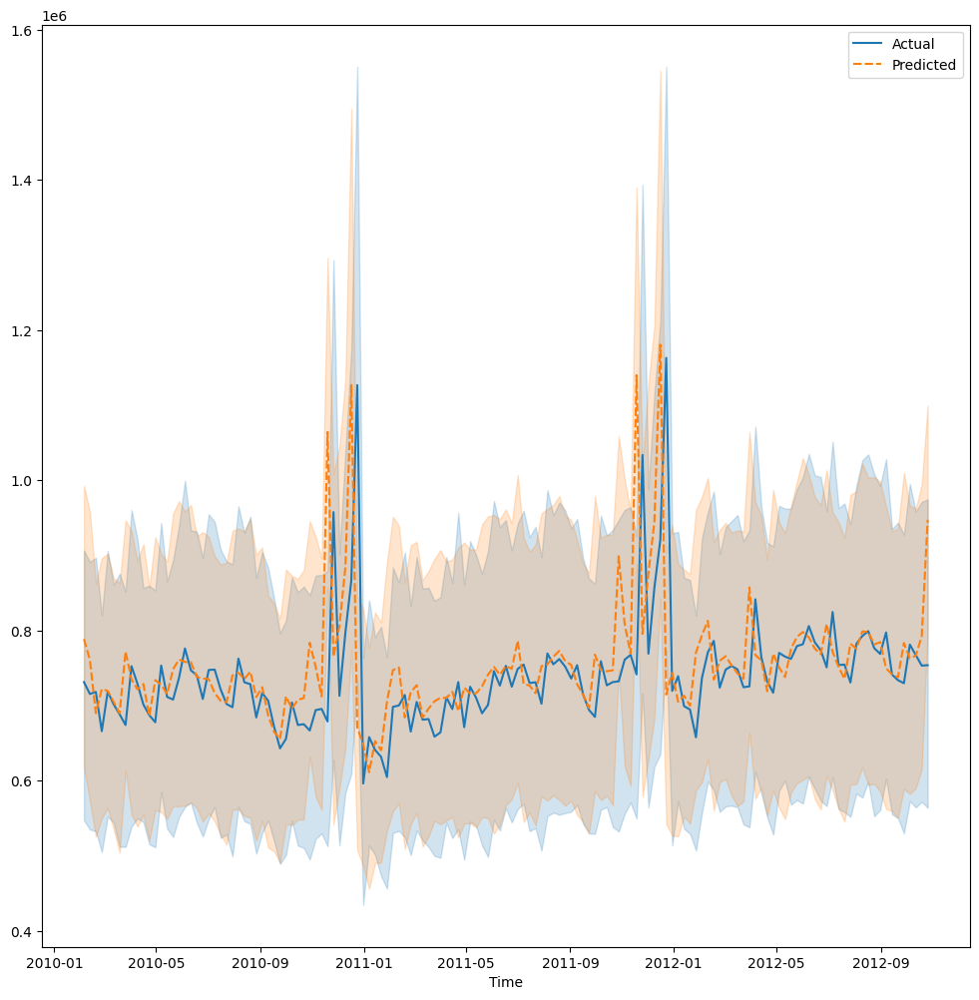

In [83]:

df_plot = pd.DataFrame({'Time': df['Weekly_Sales'].index[split_length:],
                        'Actual': df['Weekly_Sales'].values[split_length:],
                        'Predicted': lightgbm_prediction})
df_plot = df_plot.set_index('Time')
plt.figure(figsize=(12,12))
sns.lineplot(data = df_plot)

In [84]:
from tensorflow.keras.preprocessing import timeseries_dataset_from_array

In [85]:


sequence_length = 200

tf_train_dataset = timeseries_dataset_from_array(x_train.to_numpy(), targets= y_train.to_numpy()[sequence_length:], sequence_length = sequence_length, batch_size=128)
tf_test_dataset = timeseries_dataset_from_array(x_test.to_numpy(), targets= y_test.to_numpy()[sequence_length:], sequence_length =sequence_length, batch_size=128)

In [86]:
import tensorflow

In [87]:
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras import Input, Model

In [88]:
input1 = Input(shape = ([None,x_train.shape[1]]))
x = LSTM(50)(input1)
x = Dense(64)(x)
output1 = Dense(1)(x)

model_1 = Model(input1, output1)

model_1.compile(loss = 'mse', optimizer = 'adam', metrics = [tensorflow.keras.metrics.RootMeanSquaredError()])
model_1.summary()



Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, 16)]        0         
                                                                 
 lstm (LSTM)                 (None, 50)                13400     
                                                                 
 dense (Dense)               (None, 64)                3264      
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 16729 (65.35 KB)
Trainable params: 16729 (65.35 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [89]:
model_1.fit(tf_train_dataset, validation_data=tf_test_dataset, epochs=25)

Epoch 1/25

34/34 [==============================] - 3s 64ms/step - loss: 1669560532992.0000 - root_mean_squared_error: 1292114.7500 - val_loss: 709684953088.0000 - val_root_mean_squared_error: 842428.0000
Epoch 2/25
34/34 [==============================] - 2s 54ms/step - loss: 1669500764160.0000 - root_mean_squared_error: 1292091.6250 - val_loss: 709626822656.0000 - val_root_mean_squared_error: 842393.5000
Epoch 3/25
34/34 [==============================] - 2s 52ms/step - loss: 1669394333696.0000 - root_mean_squared_error: 1292050.5000 - val_loss: 709545033728.0000 - val_root_mean_squared_error: 842344.9375
Epoch 4/25
34/34 [==============================] - 2s 55ms/step - loss: 1669253038080.0000 - root_mean_squared_error: 1291995.7500 - val_loss: 709440176128.0000 - val_root_mean_squared_error: 842282.6875
Epoch 5/25
34/34 [==============================] - 2s 55ms/step - loss: 1669075828736.0000 - root_mean_squared_error: 1291927.1250 - val_loss: 709311135744.0000 - val_root_mean_s

In [90]:
preds = model_1.predict(np.expand_dims(x_test, axis = 1))

61/61 [==============================] - 0s 550us/step


In [91]:
np.sqrt(mean_squared_error(df['Weekly_Sales'].values[split_length:], preds))

832690.6509862994

In [92]:
input2 = Input(shape = ([None,x_train.shape[1]]))
x = LSTM(100, activation='relu',return_sequences=True)(input2)
x = LSTM(200)(x)
x = Dense(64, activation = 'relu')(x)
output2 = Dense(1)(x)

model_2 = Model(input2, output2)

model_2.compile(loss = 'mse', optimizer = 'adam', metrics = [tensorflow.keras.metrics.RootMeanSquaredError()])
model_2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, 16)]        0         
                                                                 
 lstm_1 (LSTM)               (None, None, 100)         46800     
                                                                 
 lstm_2 (LSTM)               (None, 200)               240800    
                                                                 
 dense_2 (Dense)             (None, 64)                12864     
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 300529 (1.15 MB)
Trainable params: 300529 (1.15 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [93]:
model_2.fit(tf_train_dataset, validation_data=tf_test_dataset, epochs=25)

Epoch 1/25
34/34 [==============================] - 15s 409ms/step - loss: 1669539168256.0000 - root_mean_squared_error: 1292106.5000 - val_loss: 709654282240.0000 - val_root_mean_squared_error: 842409.8125
Epoch 2/25
34/34 [==============================] - 14s 405ms/step - loss: 1669441388544.0000 - root_mean_squared_error: 1292068.6250 - val_loss: 709578588160.0000 - val_root_mean_squared_error: 842364.8750
Epoch 3/25
34/34 [==============================] - 14s 403ms/step - loss: 1669541920768.0000 - root_mean_squared_error: 1292107.5000 - val_loss: 709706711040.0000 - val_root_mean_squared_error: 842440.9375
Epoch 4/25
34/34 [==============================] - 14s 408ms/step - loss: 1669572722688.0000 - root_mean_squared_error: 1292119.5000 - val_loss: 709706711040.0000 - val_root_mean_squared_error: 842440.9375
Epoch 5/25
34/34 [==============================] - 14s 401ms/step - loss: 1669572722688.0000 - root_mean_squared_error: 1292119.5000 - val_loss: 709706711040.0000 - val_ro

In [94]:
preds2 = model_2.predict(np.expand_dims(x_test, axis = 1))
np.sqrt(mean_squared_error(df['Weekly_Sales'].values[split_length:], preds2))


61/61 [==============================] - 0s 832us/step


833193.6342085067

<Axes: xlabel='Time'>

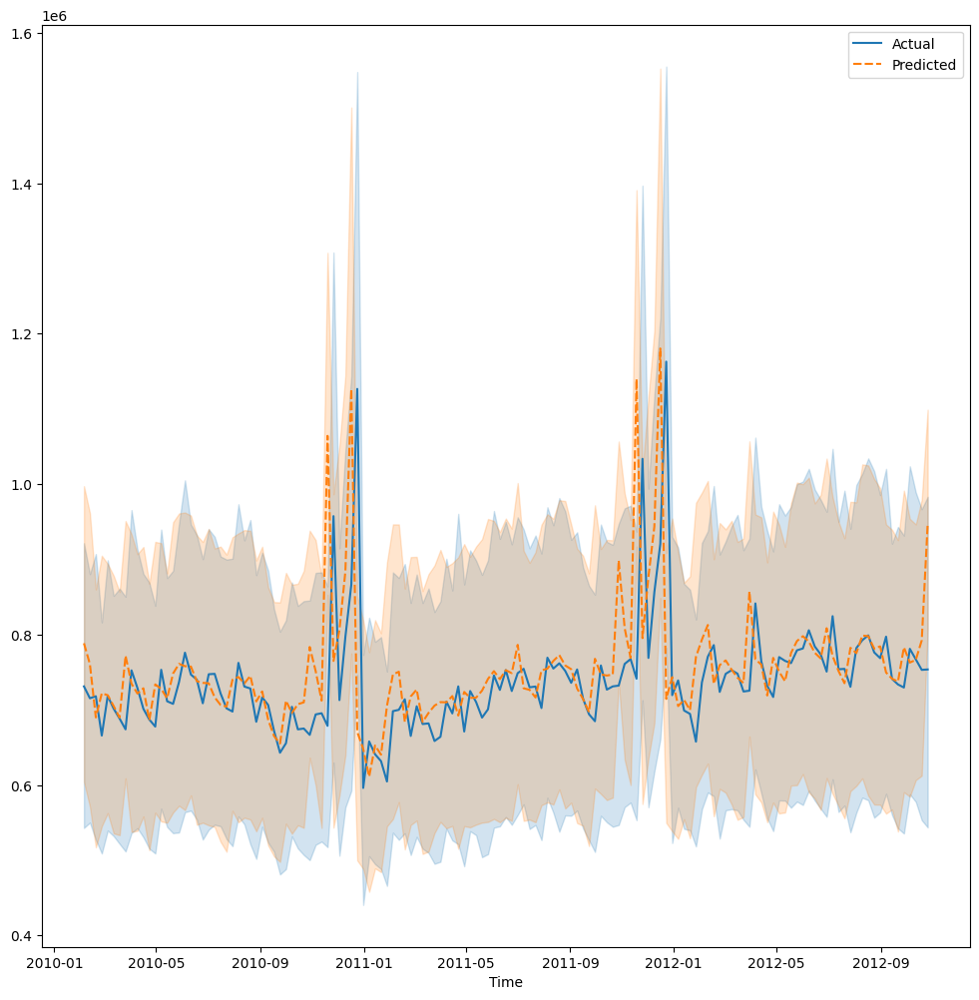

In [95]:
df_plot2 = pd.DataFrame({'Time': df['Weekly_Sales'].index[split_length:],
                        'Actual': df['Weekly_Sales'].values[split_length:],
                        'Predicted': preds.flatten()})


plt.figure(figsize=(12,12))
sns.lineplot(data = df_plot)

<Axes: xlabel='Time'>

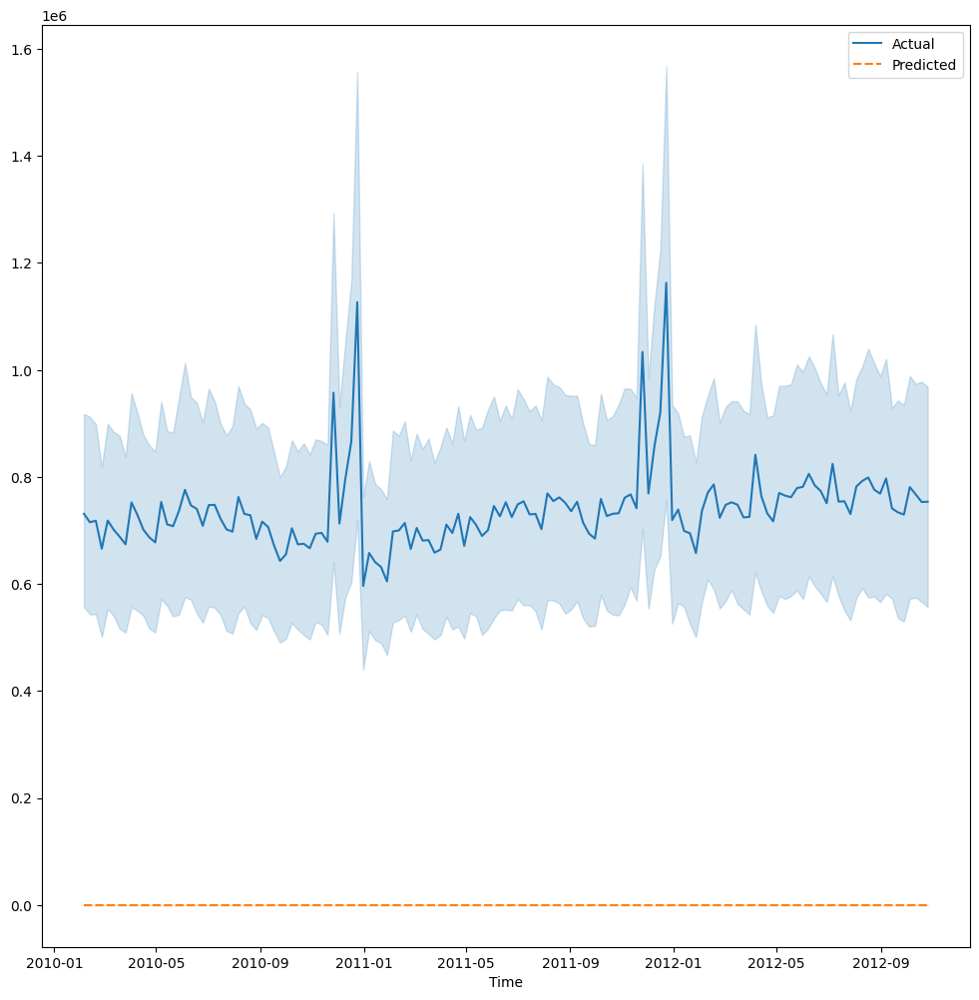

In [96]:
df_plot = pd.DataFrame({'Time': df['Weekly_Sales'].index[split_length:],
                        'Actual': df['Weekly_Sales'].values[split_length:],
                        'Predicted': preds2.flatten()})
df_plot = df_plot.set_index('Time')
plt.figure(figsize=(12,12))
sns.lineplot(data = df_plot)